### Attempting to use NN as hitpattern source and rLCE

We will the neural net and rlce as sources and reconstruct positions with the other to see what happens

Also use the flow network to reconstruct positions

In [1]:
not_dead_pmts = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 157, 158, 159, 160, 161, 162, 163, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252]
dead_pmts = [28, 108, 121, 144, 156, 164, 177]

In [2]:
import straxen

pmt_pos = straxen.pmt_positions()
pmt_pos_top = pmt_pos[pmt_pos.array == "top"].to_numpy()
n_pmts = pmt_pos_top.shape[0]
tpc_radius = 66.4
pmt_radius = straxen.tpc_pmt_radius

2025-01-26 14:32:50,425 - admix - WARNING - Initializing utilix DB failed. You cannot do database operations


DB initialization failed


In [3]:
import os, sys
sys.path.append(os.path.join(os.getcwd(), 'ActualThesisWork'))
%load_ext autoreload
%autoreload 2
from functions import *
import numpy as np
import matplotlib.pyplot as plt

2025-01-26 14:32:51.944111: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-01-26 14:32:52.002655: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2025-01-26 14:32:52.269581: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-01-26 14:32:52.269642: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-01-26 14:32:52.319781: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to

In [4]:
# Load pattern models 

# Load rLCE
from tensorflow import keras
import tensorflow as tf
class FilterAlive(keras.layers.Layer):
    def __init__(self, alive_pmt_indices, **kwargs):
        super().__init__(**kwargs)
        self.alive = alive_pmt_indices
    
    def call(self, X):
        return tf.gather(X, self.alive, axis = -1)
    
    def compute_output_shape(self, input_shape):
        return (input_shape[0], self.alive.shape)
    
# Taken from Shenyang and slightly modified
import math
class Likelihood(tf.keras.layers.Layer):
    def __init__(self, n_pmts, **kwargs):
        super().__init__(**kwargs)
        self.n_pmts = n_pmts

    def build(self, input_shape):
        self.sigma = self.add_weight(
            shape=(self.n_pmts, ), dtype=tf.float32, name='sigma',
            initializer=tf.keras.initializers.Ones(),
            trainable=True)
        self.power = self.add_weight(
            shape=(self.n_pmts, ), dtype=tf.float32, name='power',
            initializer=tf.keras.initializers.Ones(),
            trainable=True)
        super().build(input_shape)

    def call(self, inputs):
        
        cex, cob = inputs[0], inputs[1]
        c = tf.reduce_sum(cob, axis=-1)
        c = tf.reshape(c, (-1, 1))
        cex = cex * c # aex/aob is [events*pmtsize tensor]
        broaden = 1.2
        cons= 0.1
        y = - (
            ((cob * tf.math.log(cex) -tf.math.lgamma(cob + 1)) - 
                (cex * tf.math.log(cex) - tf.math.lgamma(cex + 1)) 
            )
        * cex / (broaden * cex + (0.1* self.sigma * cex**self.power) ** 2 + cons)
        - 0.5 * tf.math.log(2 * math.pi * ( broaden * cex + (0.1 * self.sigma * cex**self.power) **2 + cons)))
        
        chi2 = - 2 * (
            ((cob * tf.math.log(cex) -tf.math.lgamma(cob + 1)) - 
                (cex * tf.math.log(cex) - tf.math.lgamma(cex + 1)) 
            )
        * cex / (broaden * cex + (0.1* self.sigma * cex**self.power) ** 2 + cons)
        )
        return tf.reduce_sum(y, axis=1) / self.n_pmts, tf.reduce_sum(chi2, axis=1) / self.n_pmts#, 2*keras.backend.sum(cob*tensorflow.math.log(cob/cex) - (cob - cex), axis=1) / self.n_pmts

def _logl_loss(patterns, likelihood):
    return likelihood[0]

with tf.keras.utils.custom_object_scope({'_logl_loss': _logl_loss}):
    model = tf.keras.models.load_model(f"{os.getcwd()}/LCE_SR1/LCE_Neural_SR1")
model_chi2 = tf.keras.Model(
            model.inputs, model.get_layer("Likelihood").output
        )
loss_weights = model_chi2.get_layer('Likelihood').get_weights()

model_pattern = tf.keras.Model(model.inputs[0],
                                model.get_layer('normalization_1').output)


pmt_positions = pmt_pos_top[:,-2:]
i0s = np.array([4.3321685e-03, 4.8899297e-03, 4.8685744e-03, 5.0057671e-03, 5.0926125e-03, 3.8192207e-03, 5.0742184e-03, 4.5723971e-03, 4.4081882e-03, 4.2195930e-03, 3.8486260e-03, 4.1838391e-03, 4.0647872e-03, 4.7091218e-03, 5.0830012e-03, 3.3815645e-03, 4.4174474e-03, 4.2217500e-03, 3.8883914e-03, 4.1160719e-03, 4.2805159e-03, 3.8807073e-03, 4.0655909e-03, 4.1060778e-03, 4.1315975e-03, 4.7936141e-03, 3.2942444e-03, 4.9037142e-03, 7.7721901e-10, 3.8406078e-03, 4.3384172e-03, 4.0945616e-03, 4.1323849e-03, 3.5376074e-03, 4.1092960e-03, 4.0294765e-03, 4.2530410e-03, 4.3881517e-03, 4.3557761e-03, 5.2265157e-03, 4.7099791e-03, 4.0602549e-03, 3.7400448e-03, 3.7515005e-03, 4.2108428e-03, 3.9731641e-03, 3.8805525e-03, 4.0709740e-03, 4.3926593e-03, 3.8181171e-03, 4.2493315e-03, 4.1600037e-03, 4.4732001e-03, 5.6759203e-03, 5.1910682e-03, 4.2152693e-03, 3.8856652e-03, 3.9358442e-03, 3.9593815e-03, 4.5243143e-03, 3.3824742e-03, 4.2228648e-03, 4.1722674e-03, 4.0427274e-03, 4.0417486e-03, 3.9301920e-03, 3.6303743e-03, 4.8567164e-03, 4.6816585e-03, 4.6605649e-03, 4.1111340e-03, 3.9693397e-03, 3.9644395e-03, 3.6394752e-03, 4.1905139e-03, 3.8725468e-03, 4.0893927e-03, 4.0443619e-03, 3.8839907e-03, 4.1380730e-03, 3.7537001e-03, 3.9355555e-03, 3.7318014e-03, 3.8118435e-03, 5.2085049e-03, 4.2290958e-03, 4.0234900e-03, 3.5676390e-03, 3.9484301e-03, 4.2167031e-03, 4.2368169e-03, 4.1302987e-03, 4.2008958e-03, 4.2801257e-03, 4.1032447e-03, 4.4811480e-03, 4.2696339e-03, 3.6081157e-03, 4.0258458e-03, 3.9694263e-03, 4.5943419e-03, 4.1785482e-03, 4.4084764e-03, 3.7471219e-03, 4.4116797e-03, 4.0504644e-03, 4.1418886e-03, 4.0030433e-03, 1.0424008e-09, 4.2052269e-03, 4.2578629e-03, 4.5622797e-03, 4.0193330e-03, 4.1911956e-03, 4.2375987e-03, 4.2547933e-03, 3.5730435e-03, 4.5289211e-03, 4.9987421e-03, 4.0041506e-03, 3.9206431e-03, 8.3443069e-10, 4.0859459e-03, 4.0822630e-03, 4.1334494e-03, 4.3958416e-03, 4.0311846e-03, 4.0570530e-03, 4.8540146e-03, 4.1181887e-03, 4.2905537e-03, 3.9505828e-03, 4.1115014e-03, 4.2378809e-03, 5.4844008e-03, 5.1576579e-03, 4.2841639e-03, 4.0341225e-03, 3.7783773e-03, 4.0266900e-03, 4.2498759e-03, 4.2951452e-03, 4.3143658e-03, 4.1313837e-03, 2.1348676e-09, 4.1051428e-03, 4.2898878e-03, 4.2597717e-03, 3.8951659e-03, 4.0271045e-03, 4.2793071e-03, 4.0357350e-03, 3.9217505e-03, 3.9514182e-03, 4.1377540e-03, 3.9742026e-03, 1.2402929e-09, 3.9072270e-03, 4.0098960e-03, 4.4543701e-03, 4.4421032e-03, 4.2735850e-03, 4.3578045e-03, 3.8933735e-03, 6.5661332e-10, 4.0731006e-03, 4.1153133e-03, 3.7559553e-03, 5.4024002e-03, 4.3515279e-03, 3.6778662e-03, 4.5253038e-03, 4.1828337e-03, 4.0867706e-03, 4.4803121e-03, 4.2735278e-03, 4.0277829e-03, 3.0061767e-10, 4.3173237e-03, 3.6315513e-03, 3.7630824e-03, 3.9289133e-03, 3.7644394e-03, 4.8030056e-03, 4.8184181e-03, 3.8601037e-03, 4.0834383e-03, 3.8238778e-03, 3.9222855e-03, 4.1271560e-03, 4.2299703e-03, 4.2282301e-03, 4.2152260e-03, 4.2188424e-03, 4.2601079e-03, 4.1266191e-03, 3.9463951e-03, 4.1020829e-03, 5.2572191e-03, 5.6053256e-03, 4.0953509e-03, 4.2140838e-03, 4.0869401e-03, 4.3971362e-03, 3.9943284e-03, 3.9221593e-03, 4.0147733e-03, 3.9175176e-03, 4.2255772e-03, 3.2839905e-03, 3.5796922e-03, 4.3001343e-03, 5.2305199e-03, 5.2561881e-03, 4.1396990e-03, 3.9065215e-03, 4.0462790e-03, 4.4015646e-03, 3.9156144e-03, 4.1807001e-03, 3.7336536e-03, 2.8916472e-03, 4.3796739e-03, 3.7167547e-03, 3.8832054e-03, 4.9040765e-03, 4.0531182e-03, 4.4816649e-03, 4.2975284e-03, 4.2031519e-03, 3.7932515e-03, 3.6113819e-03, 4.0321909e-03, 4.0693702e-03, 3.8203422e-03, 4.2403601e-03, 4.1839005e-03, 4.4256304e-03, 4.6902383e-03, 4.6948199e-03, 4.1613793e-03, 4.3950700e-03, 4.9116057e-03, 4.2219968e-03, 4.4758134e-03, 4.3810243e-03, 5.3808806e-03, 4.1074217e-03, 4.7744270e-03, 5.3171408e-03, 5.0322791e-03, 4.8009814e-03, 4.0162178e-03])[not_dead_pmts]
rLCE_params = [1.6266745e+00,  9.4918861e+00, -4.2176653e-05,  7.7804564e-03,]

n_alive_pmts = n_pmts - len(dead_pmts)
# Model modified for Radial LCE
input_x = tf.keras.layers.Input(shape=(2,), name='xx', dtype=tf.float32)
x = tf.keras.layers.RepeatVector(n_alive_pmts, name='repeat_vector')(input_x)
rho = GetRadius((n_alive_pmts, 1), keras.backend.variable(pmt_positions[not_dead_pmts]), name='Event_Distance')(x)
#WallDist = GetWallDist((n_alive_pmts, 1),tpc_radius,name="WallDist")(x)
x = RadialLCELayer(guess=rLCE_params, n_groups=1, group_slices=np.arange(n_alive_pmts).reshape(1,-1),name='radial_LCE')((rho))
x = I0Layer(n_alive_pmts, name='i0')(x)
x = NormalizationLayer(name='normalization')(x)
# We pass the full array
input_y = tf.keras.layers.Input(shape=(n_pmts,), name='yy', dtype=tf.float32)
y_mod = FilterAlive(not_dead_pmts, name='aliveFilter')(input_y)
y, chi2 = Likelihood(n_alive_pmts, name='Likelihood')([x, y_mod])
radial_mc = tf.keras.models.Model(inputs=[input_x, input_y],
                                    outputs=[y, chi2], name='Radial_mc')

radial_mc.get_layer('i0').set_weights([i0s]) 
radial_mc.get_layer('i0').trainable = False
# No trainable Params but recongized as for some reason
radial_mc.get_layer('Event_Distance').trainable = False
#radial_mc.get_layer('WallDist').trainable = False
radial_mc.get_layer('radial_LCE').trainable = True
radial_mc.get_layer('Likelihood').trainable = False
radial_mc.get_layer('Likelihood').set_weights(loss_weights)

radial_pattern = tf.keras.Model(radial_mc.inputs[0],
                    radial_mc.get_layer('normalization').output ) 


# Load Flow 
fname = f'{os.getcwd()}/posrec_models_from_straxen/flow_20240730.tar.gz'
import tarfile 
def open_jax_model(model_path: str, **kwargs):
    # Copied directly from straxen including the two functions below (modified where required)
    # Nested import to reduce loading time of import straxen as it's not
    # a base requirement
    from jax import export

    # Check if the model file exists
    if not os.path.exists(model_path):
        raise FileNotFoundError(f"No file at {model_path}")
    # Extract required parameters from kwargs
    n_poly = kwargs["n_poly"]
    sig = kwargs["sig"]

    # Open the tar file and extract the requested model
    with tarfile.open(model_path, "r") as f:
        names = f.getnames()

        # Construct the filename based on n_poly and sig
        filename = f"{int(n_poly):02d}_{float(sig) * 1000:3.0f}"

        # Check if the requested model exists in the tar file
        if filename not in names:
            raise ValueError("Requested model not in tarfile!")

        # Extract and read the serialized JAX object
        file_obj = f.extractfile(filename)
        assert file_obj is not None
        serialized_jax_object = file_obj.read()
    # Deserialize the JAX object and return its callable function
    return export.deserialize(serialized_jax_object).call
def vectorized_prediction_chunk(patterns, pred_function, N_chunk_max):
    N_entries = patterns.shape[0]
    if N_entries > N_chunk_max:
        raise ValueError("Chunk greater than max size")
    else:
        inputs = np.zeros((N_chunk_max, pmt_pos_top.shape[0]+1))
        inputs[:N_entries] = patterns
        xy, contour = pred_function(inputs)
        return xy[:N_entries], contour[:N_entries]
def prediction_loop(patterns, pred_function, N_chunk_max=4096):
    N_entries = patterns.shape[0]
    # If the number of entries is within the chunk limit, process in one step
    if N_entries <= N_chunk_max:
        xy, _ = vectorized_prediction_chunk(patterns, pred_function, N_chunk_max)
        return [xy]  # Return as a single-element list for consistency
    N_chunks = N_entries // N_chunk_max
    xy_list = []
    # Process chunks
    for i in range(N_chunks):
        xy, _ = vectorized_prediction_chunk(
            patterns[i * N_chunk_max : (i + 1) * N_chunk_max], pred_function, N_chunk_max
        )
        xy_list.append(xy)

    # Process remaining entries, if any
    if N_chunks * N_chunk_max < N_entries:
        xy, _ = vectorized_prediction_chunk(
            patterns[N_chunks * N_chunk_max :], pred_function, N_chunk_max
        )
        xy_list.append(xy)
    return np.concatenate(xy_list, axis=0)

def prediction_loop(patterns, pred_function, N_chunk_max=4096):
    N_entries = patterns.shape[0]
    if N_entries <= N_chunk_max:
        return vectorized_prediction_chunk(patterns, pred_function, N_chunk_max)
    N_chunks = N_entries // N_chunk_max

    xy_list = []
    contour_list = []
    for i in range(N_chunks):
        xy, contour = vectorized_prediction_chunk(
            patterns[i * N_chunk_max : (i + 1) * N_chunk_max], pred_function, N_chunk_max
        )
        xy_list.append(xy)
        contour_list.append(contour)

    if N_chunks * N_chunk_max < N_entries:
        xy, contour = vectorized_prediction_chunk(
            patterns[N_chunks * N_chunk_max :], pred_function, N_chunk_max
        )
        xy_list.append(xy)
        contour_list.append(contour)
    return np.concatenate(xy_list, axis=0), np.concatenate(contour_list, axis=0)

flow_model = open_jax_model(fname, n_poly=32, sig=0.393)
log_area_scale = 10

def use_flow_model(patterns):
    with np.errstate(divide="ignore", invalid="ignore"):
        total_top_areas = patterns.sum(axis=1, keepdims=True)
        area_per_channel_top = patterns
        flow_data = np.concatenate(
            [
                area_per_channel_top / total_top_areas,  # Normalize areas per channel
                np.log(total_top_areas) / log_area_scale,  # Log-scale transformation
            ],
            axis=1,
        )
    return prediction_loop(flow_data, flow_model)



## Generate Grid

In [6]:
# Large enough to resolve anode mesh if present 
# -> 4x min res because we also need to downsample after 
gridpoints = int(6*tpc_radius)
num_points = int(np.pi*gridpoints**2)  # Total number of points to match the resolution
r = np.sqrt(np.random.uniform(0, 1, num_points)) * tpc_radius  # Random radius
theta = np.random.uniform(0, 2 * np.pi, num_points)            # Random angle

# Convert polar coordinates to Cartesian
x = r * np.cos(theta)
y = r * np.sin(theta)

# Combine into a single array
xy_grid = np.vstack([x, y]).T

## Predict pattern NN optimize with rLCE

In [7]:
nn_grid_pred = model_pattern.predict({'xx':xy_grid})

15552/15552 [==============================] - 36s 2ms/step


In [8]:
# Simulate response 
n_photons = int(1000)
# Generate base photon signal
total_signal = np.random.poisson(lam=n_photons, size=nn_grid_pred.shape[0]) 

# Distribute the signal over the bins
signal_distribution = np.zeros_like(nn_grid_pred)
for i in range(nn_grid_pred.shape[0]):
    signal_distribution[i, :] = np.random.multinomial(
        total_signal[i], nn_grid_pred[i, :]
    )

# Accounted double photon - data is int already jsut flaot formated

# Extract vars and compute data driven broadening 
sigma = radial_mc.get_layer("Likelihood").sigma
gamma = radial_mc.get_layer("Likelihood").power
variance = (sigma * signal_distribution**gamma)**2 + 0.2

broadening_array = np.random.normal(loc=signal_distribution, scale=np.sqrt(variance), size=(nn_grid_pred.shape))

double_PE_Emission = broadening_array + np.random.binomial(n=signal_distribution.astype('int'), p=0.2)


# And update predictions array
nn_grid_rand = np.zeros((nn_grid_pred.shape[0],253))
nn_grid_rand[:, not_dead_pmts] = signal_distribution#broadening_array

In [9]:
#               Generate rLCE encoder model 
n_to_update = len(xy_grid)
input_x = keras.layers.Input(shape=(1,))
# Position embedding
m = keras.layers.Embedding(n_to_update, 2, input_length = 1, name='embed_pos')(input_x)
# Pattern Embedding
pat = keras.layers.Embedding(n_to_update, 253, input_length = 1, name='embed_pat')(input_x)
m = keras.layers.Flatten()(m)
pat = keras.layers.Flatten()(pat)
m = radial_mc({'xx': m, 'yy':pat})
rlce_encoder = keras.models.Model(inputs= input_x, outputs=m, name="Position_Updater")
# radial mc 
rlce_encoder.layers[-1].trainable = False
rlce_encoder.get_layer('embed_pos').set_weights([xy_grid])
rlce_encoder.get_layer('embed_pat').set_weights([nn_grid_rand])
rlce_encoder.get_layer('embed_pat').trainable = False

In [10]:

def gen_better_pos(model, pos, patterns, min_diff, idx = 1):
    offsets = np.array([-1, 0, 1])
    patterns_expanded = np.repeat(patterns[:, None, :], 9, axis=1)
    pat_shape = patterns_expanded.shape
    while min_diff <= 1/idx:
        dx, dy = np.meshgrid(offsets/idx, offsets/idx, indexing='ij') 
        # Add the offsets to all points using broadcasting
        grid = pos[:, None, :] + np.stack([dx.ravel(), dy.ravel()], axis=-1)[None, :, :] # n , 9, 2
        chi = model.predict({'xx':grid.reshape(-1, 2), 'yy':patterns_expanded.reshape(-1, pat_shape[-1])})[1]
        pos = grid[np.arange(pat_shape[0]),np.argmin(chi.reshape(pat_shape[0], 9), axis=-1)]
        idx = 2*idx
    return pos
new_pos = gen_better_pos(radial_mc, xy_grid, nn_grid_rand, min_diff=1/128, idx=1) # 7 * 155s 


139962/139962 [==============================] - 133s 949us/step


In [9]:
# And train
n_iter = 50
new_pos = tensorflow.identity(xy_grid)
loss    = radial_mc({'xx': xy_grid, 'yy':nn_grid_rand})[1]

early_stopping = tensorflow.keras.callbacks.EarlyStopping(
    monitor='loss',
    restore_best_weights=True,
    patience=4,    
    min_delta=0.05,
    mode='min',    
    verbose=1      
)
reduce_lr = tensorflow.keras.callbacks.ReduceLROnPlateau(
    monitor='loss', 
    mode = 'min',
    factor=0.5,     
    patience=2,     
    min_delta=0.05, 
    min_lr=1e-3,    
    verbose=1       
)

for i in range(n_iter):
    print("Jagged iter {}".format(i))
    # tensorflow_probability requires tensorflow >= 2.16 we have == 2.15
    # Random dist gives max deviation root{2}*pmt_radius (~70% of diameter)
    noise_pos = tensorflow.identity(xy_grid) + np.random.rand(*new_pos.numpy().shape) * pmt_radius/4
    # Update and fit encoder model positions
    rlce_encoder.get_layer('embed_pos').set_weights([noise_pos])
    # Compile and fit
    rlce_encoder.compile(loss= _logl_loss, optimizer = keras.optimizers.Adam(learning_rate=1e-1))
    rlce_encoder.fit(x = np.arange(n_to_update), y = nn_grid_rand, 
                    epochs = 20, batch_size = 2**10,
                    callbacks=[early_stopping,reduce_lr], verbose = 1) 
    noise_pos = rlce_encoder.get_layer('embed_pos').get_weights()[0]
    # Check result of new pos
    jittered_loss = radial_mc({'xx': noise_pos, 'yy':nn_grid_rand})[1]
    better = jittered_loss < loss
    loss =    tensorflow.where(better, jittered_loss, loss) 
    new_pos = tensorflow.where(tensorflow.expand_dims(better, axis=-1), noise_pos, new_pos) 

Jagged iter 0
Epoch 1/20
1353/1353 [==============================] - 22s 15ms/step - loss: 1.9715 - Radial_mc_loss: 1.5559 - Radial_mc_1_loss: 0.4156 - lr: 0.1000
Epoch 2/20
1353/1353 [==============================] - 15s 11ms/step - loss: 1.9786 - Radial_mc_loss: 1.5609 - Radial_mc_1_loss: 0.4177 - lr: 0.1000
Epoch 3/20
1349/1353 [============================>.] - ETA: 0s - loss: 1.9732 - Radial_mc_loss: 1.5587 - Radial_mc_1_loss: 0.4145
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.05000000074505806.
1353/1353 [==============================] - 16s 12ms/step - loss: 1.9732 - Radial_mc_loss: 1.5587 - Radial_mc_1_loss: 0.4144 - lr: 0.1000
Epoch 4/20
1353/1353 [==============================] - 16s 12ms/step - loss: 1.9736 - Radial_mc_loss: 1.5582 - Radial_mc_1_loss: 0.4154 - lr: 0.0500
Epoch 5/20
1353/1353 [==============================] - ETA: 0s - loss: 1.9748 - Radial_mc_loss: 1.5588 - Radial_mc_1_loss: 0.4160Restoring model weights from the end of the best epoch: 1.

Ep

2025-01-25 11:42:50.419029: W external/local_tsl/tsl/framework/bfc_allocator.cc:485] Allocator (mklcpu) ran out of memory trying to allocate 1.27GiB (rounded to 1362953216)requested by op Lgamma
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2025-01-25 11:42:50.428632: I external/local_tsl/tsl/framework/bfc_allocator.cc:1039] BFCAllocator dump for mklcpu
2025-01-25 11:42:50.428976: I external/local_tsl/tsl/framework/bfc_allocator.cc:1046] Bin (256): 	Total Chunks: 0, Chunks in use: 0. 0B allocated for chunks. 0B in use in bin. 0B client-requested in use in bin.
2025-01-25 11:42:50.429064: I external/local_tsl/tsl/framework/bfc_allocator.cc:1046] Bin (512): 	Total Chunks: 0, Chunks in use: 0. 0B allocated for chunks. 0B in use in bin. 0B client-requested in use in bin.
2025-01-25 11:42:50.429080: I external/local_tsl/tsl/framework

ResourceExhaustedError: Exception encountered when calling layer 'Likelihood' (type Likelihood).

{{function_node __wrapped__Lgamma_device_/job:localhost/replica:0/task:0/device:CPU:0}} OOM when allocating tensor with shape[1385115,246] and type float on /job:localhost/replica:0/task:0/device:CPU:0 by allocator mklcpu [Op:Lgamma] name: 

Call arguments received by layer 'Likelihood' (type Likelihood):
  • inputs=['tf.Tensor(shape=(1385115, 246), dtype=float32)', 'tf.Tensor(shape=(1385115, 246), dtype=float32)']

In [11]:
# And reconstruct with the flow model
flow_pos_nn, flow_contours_nn  = use_flow_model(nn_grid_rand)

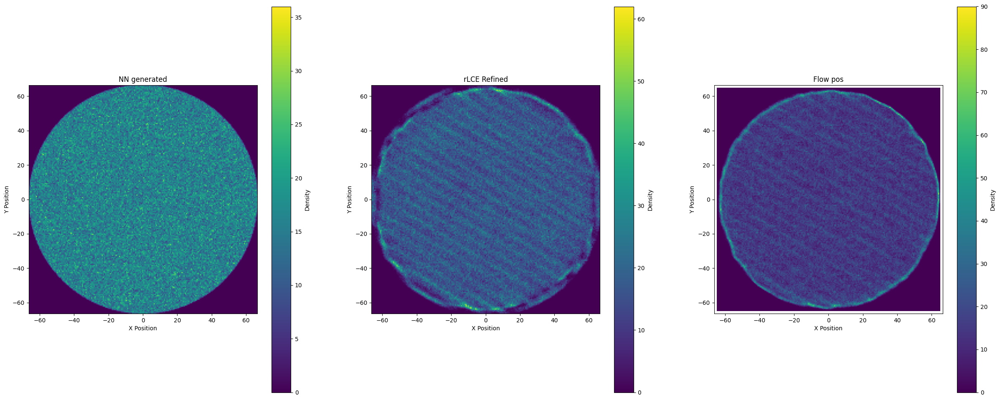

In [12]:
fig, ax = plt.subplots(1,3, figsize=(30,12))
do_density_plot(ax[0], xy_grid, title="NN generated", bins = gridpoints //2)
do_density_plot(ax[1], new_pos, title="rLCE Refined", bins = gridpoints //2)
ax[1].set_xlim(ax[0].get_xlim())
ax[1].set_ylim(ax[0].get_ylim())
do_density_plot(ax[2], flow_pos_nn[~np.isnan(flow_pos_nn).any(axis=-1), :], title="Flow pos", bins = gridpoints //2)
ax[2].set_xlim(ax[1].get_xlim())
ax[2].set_ylim(ax[1].get_ylim())
#plt.hist(np.sum(((xy_grid - new_pos)**2), axis=-1)**(1/2), bins =100)
plt.show()

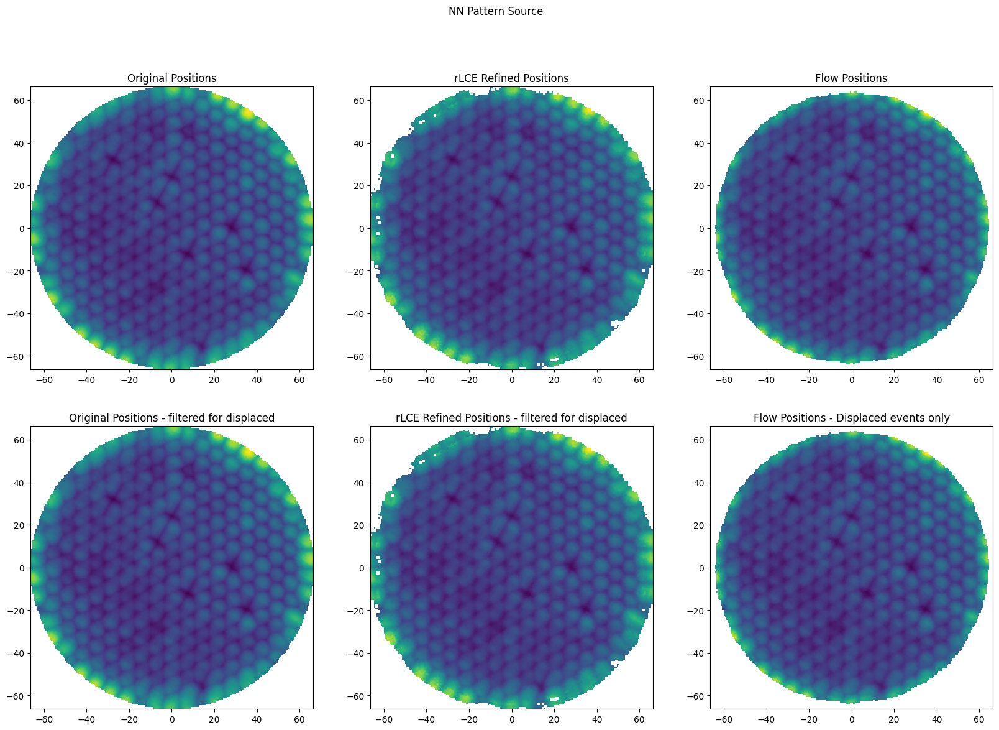

In [15]:
from scipy.stats import binned_statistic_2d
fig, ax = plt.subplots(2,3, figsize=(20,13))
ax=ax.flatten()
x_bins = np.linspace(-tpc_radius, tpc_radius, gridpoints //2 + 1)  # 20 bins for x
y_bins = np.linspace(-tpc_radius, tpc_radius, gridpoints //2 + 1)  # 20 bins for y

disp_map = ((xy_grid[:,0] - new_pos[:,0])**2 + (xy_grid[:,1] - new_pos[:,1])**2) != 0

# Compute 2D binned statistic
stat, x_edges, y_edges, binnumber = binned_statistic_2d(
    xy_grid[:,0], xy_grid[:,1], nn_grid_pred.max(axis=-1), statistic='median', bins=[x_bins, y_bins]
)
ax[0].imshow(
    stat.T, 
    origin='lower',
    extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
    aspect='equal',
    cmap='viridis'
)
ax[0].set_title("Original Positions")
stat, x_edges, y_edges, binnumber = binned_statistic_2d(
    new_pos[:,0], new_pos[:,1], nn_grid_pred.max(axis=-1), statistic='median', bins=[x_bins, y_bins]
)
ax[1].set_title("rLCE Refined Positions")
ax[1].imshow(
    stat.T, 
    origin='lower',
    extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
    aspect='equal',
    cmap='viridis'
)
stat, x_edges, y_edges, binnumber = binned_statistic_2d(
    flow_pos_nn[:,0], flow_pos_nn[:,1], nn_grid_pred.max(axis=-1), statistic='median', bins=[x_bins, y_bins]
)
ax[2].set_title("Flow Positions")
ax[2].imshow(
    stat.T, 
    origin='lower',
    extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
    aspect='equal',
    cmap='viridis'
)

stat, x_edges, y_edges, binnumber = binned_statistic_2d(
    xy_grid[disp_map,0], xy_grid[disp_map,1], nn_grid_pred.max(axis=-1)[disp_map], statistic='median', bins=[x_bins, y_bins]
)
ax[3].imshow(
    stat.T, 
    origin='lower',
    extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
    aspect='equal',
    cmap='viridis'
)
ax[3].set_title("Original Positions - filtered for displaced")
stat, x_edges, y_edges, binnumber = binned_statistic_2d(
    new_pos[disp_map,0], new_pos[disp_map,1], nn_grid_pred.max(axis=-1)[disp_map], statistic='median', bins=[x_bins, y_bins]
)
ax[4].set_title("rLCE Refined Positions - filtered for displaced")
ax[4].imshow(
    stat.T, 
    origin='lower',
    extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
    aspect='equal',
    cmap='viridis'
)

stat, x_edges, y_edges, binnumber = binned_statistic_2d(
    flow_pos_nn[disp_map,0], flow_pos_nn[disp_map,1], nn_grid_pred.max(axis=-1)[disp_map], statistic='median', bins=[x_bins, y_bins]
)
ax[5].set_title("Flow Positions - Displaced events only")
ax[5].imshow(
    stat.T, 
    origin='lower',
    extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
    aspect='equal',
    cmap='viridis'
)


fig.suptitle("NN Pattern Source")
plt.show()


## Predict pattern rLCE optimize with NN

In [16]:
rlce_grid_pred = radial_pattern.predict({'xx':xy_grid})

15552/15552 [==============================] - 10s 606us/step


In [17]:
# Simulate response 
n_photons = int(1000)
# Generate base photon signal
total_signal = np.random.poisson(lam=n_photons, size=nn_grid_pred.shape[0]) 

# Distribute the signal over the bins
signal_distribution = np.zeros_like(nn_grid_pred)
for i in range(nn_grid_pred.shape[0]):
    signal_distribution[i, :] = np.random.multinomial(
        total_signal[i], nn_grid_pred[i, :]
    )

# Accounted double photon - data is int already jsut flaot formated

# Extract vars and compute data driven broadening 
sigma = radial_mc.get_layer("Likelihood").sigma
gamma = radial_mc.get_layer("Likelihood").power
variance = (sigma * signal_distribution**gamma)**2 + 0.2

broadening_array = np.random.normal(loc=signal_distribution, scale=np.sqrt(variance), size=(nn_grid_pred.shape))

double_PE_Emission = broadening_array + np.random.binomial(n=signal_distribution.astype('int'), p=0.2)


# And update predictions array
rlce_grid_rand = np.zeros((nn_grid_pred.shape[0],253))
rlce_grid_rand[:, not_dead_pmts] = signal_distribution#broadening_array

In [18]:
# Generate new pos alternate

def gen_better_pos(model, pos, patterns, min_diff, idx = 1):
    offsets = np.array([-1, 0, 1])
    patterns_expanded = np.repeat(patterns[:, None, :], 9, axis=1)
    pat_shape = patterns_expanded.shape
    while min_diff <= 1/idx:
        dx, dy = np.meshgrid(offsets/idx, offsets/idx, indexing='ij') 
        # Add the offsets to all points using broadcasting
        grid = pos[:, None, :] + np.stack([dx.ravel(), dy.ravel()], axis=-1)[None, :, :] # n , 9, 2
        chi = model.predict({'xx':grid.reshape(-1, 2), 'yy':patterns_expanded.reshape(-1, pat_shape[-1])})[1]
        pos = grid[np.arange(pat_shape[0]),np.argmin(chi.reshape(pat_shape[0], 9), axis=-1)]
        idx = 2*idx
    return pos
new_pos = gen_better_pos(model_chi2, xy_grid, rlce_grid_rand, min_diff=1/128, idx=1) # 7 * 155s 

    

139962/139962 [==============================] - 366s 3ms/step


In [19]:
flow_pos_rLCE, flow_contours_rLCE  = use_flow_model(rlce_grid_rand)

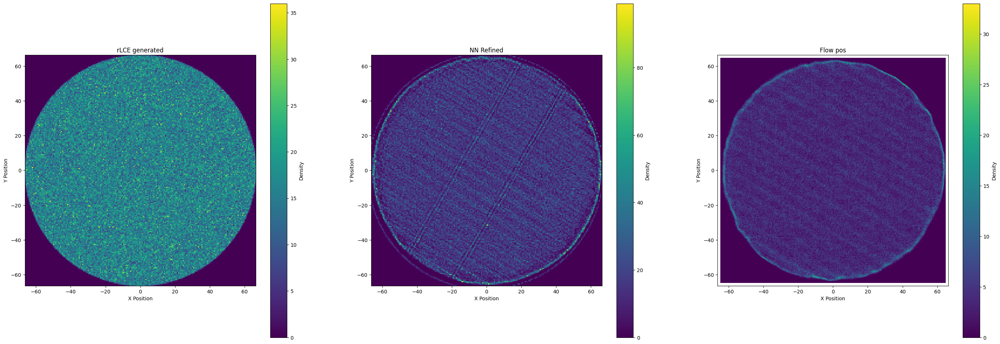

In [22]:
fig, ax = plt.subplots(1,3, figsize=(35,12))
do_density_plot(ax[0], xy_grid[disp_map], title="rLCE generated", bins = gridpoints //2)
do_density_plot(ax[1], new_pos[disp_map], title="NN Refined", bins = gridpoints //2)
ax[1].set_xlim(ax[0].get_xlim())
ax[1].set_ylim(ax[0].get_ylim())
do_density_plot(ax[2], flow_pos_rLCE[~np.isnan(flow_pos_rLCE).any(axis=-1), :], title="Flow pos", bins = gridpoints)
ax[2].set_xlim(ax[1].get_xlim())
ax[2].set_ylim(ax[1].get_ylim())
plt.show()

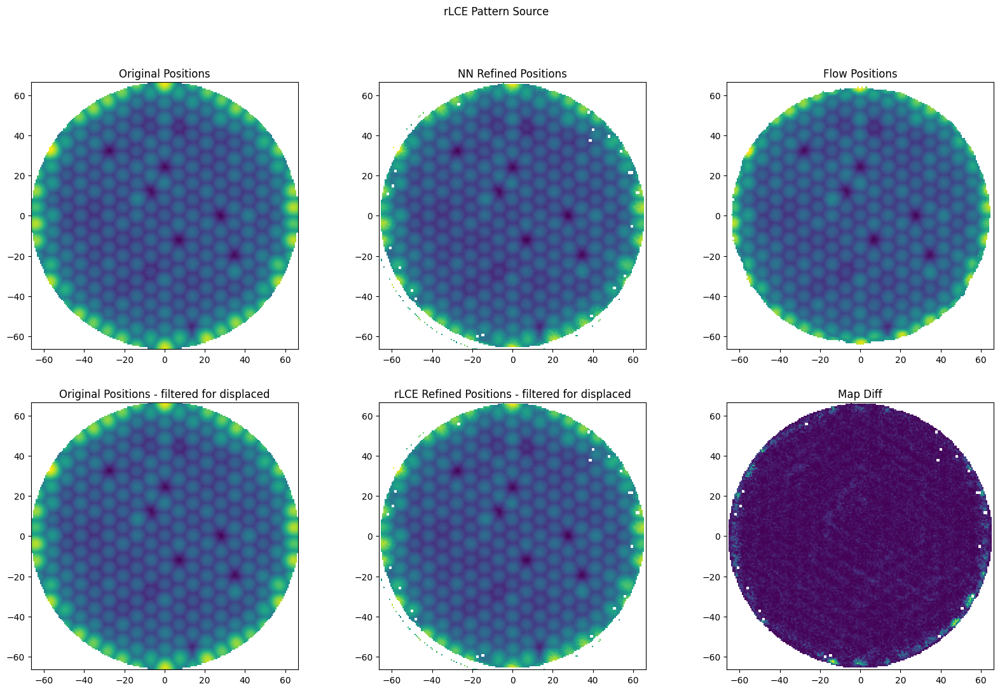

In [23]:
from scipy.stats import binned_statistic_2d
fig, ax = plt.subplots(2,3, figsize=(20,12))
ax=ax.flatten()
x_bins = np.linspace(-tpc_radius, tpc_radius, gridpoints //2 + 1)  # 20 bins for x
y_bins = np.linspace(-tpc_radius, tpc_radius, gridpoints //2 + 1)  # 20 bins for y

disp_map = ((xy_grid[:,0] - new_pos[:,0])**2 + (xy_grid[:,1] - new_pos[:,1])**2) != 0

# Compute 2D binned statistic
stat, x_edges, y_edges, binnumber = binned_statistic_2d(
    xy_grid[:,0], xy_grid[:,1], rlce_grid_pred.max(axis=-1), statistic='median', bins=[x_bins, y_bins]
)
ax[0].imshow(
    stat.T, 
    origin='lower',
    extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
    aspect='equal',
    cmap='viridis'
)
ax[0].set_title("Original Positions")
stat, x_edges, y_edges, binnumber = binned_statistic_2d(
    new_pos[:,0], new_pos[:,1], rlce_grid_pred.max(axis=-1), statistic='median', bins=[x_bins, y_bins]
)
ax[1].set_title("NN Refined Positions")
ax[1].imshow(
    stat.T, 
    origin='lower',
    extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
    aspect='equal',
    cmap='viridis'
)
stat, x_edges, y_edges, binnumber = binned_statistic_2d(
    flow_pos_rLCE[:,0], flow_pos_rLCE[:,1], rlce_grid_pred.max(axis=-1), statistic='median', bins=[x_bins, y_bins]
)
ax[2].set_title("Flow Positions")
ax[2].imshow(
    stat.T, 
    origin='lower',
    extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
    aspect='equal',
    cmap='viridis'
)

stat, x_edges, y_edges, binnumber = binned_statistic_2d(
    xy_grid[disp_map,0], xy_grid[disp_map,1], rlce_grid_pred.max(axis=-1)[disp_map], statistic='median', bins=[x_bins, y_bins]
)
ax[3].imshow(
    stat.T, 
    origin='lower',
    extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
    aspect='equal',
    cmap='viridis'
)
ax[3].set_title("Original Positions - filtered for displaced")
stat1, x_edges, y_edges, binnumber = binned_statistic_2d(
    new_pos[disp_map,0], new_pos[disp_map,1], rlce_grid_pred.max(axis=-1)[disp_map], statistic='median', bins=[x_bins, y_bins]
)
ax[4].set_title("rLCE Refined Positions - filtered for displaced")
ax[4].imshow(
    stat1.T, 
    origin='lower',
    extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
    aspect='equal',
    cmap='viridis'
)


ax[5].set_title("Map Diff")
ax[5].imshow(
    np.abs(stat-stat1).T, 
    origin='lower',
    extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
    aspect='equal',
    cmap='viridis')


fig.suptitle("rLCE Pattern Source")
plt.show()


## Check on Real Data what happens with grid refinement

REstart notebook here and reload all but grid generation

In [5]:
# Get data 
all_data_df = pd.read_pickle('/Code/processed_data/all_data_min_filter.pkl.gz', compression='gzip')
all_data_df = all_data_df[all_data_df['Source'] == 'Kr']


In [6]:
position = np.array(all_data_df['position'].to_list())
patterns = np.array(all_data_df['s2_area_per_channel'].to_list())

In [7]:
def gen_better_pos_mem_efficient(model, pos, patterns, min_diff, idx = 1):
    # So that default pos is checked first
    offsets = np.array([0, -1, 1])
    while min_diff <= 1/idx:
        best_pos = pos.copy()
        # Make chi same lenght as pos
        best_chi = np.full((len(pos),), np.inf)
        # Iterate positions to be checked
        for dx in offsets/idx:
            for dy in offsets/idx:
                grid = pos + np.array([dx, dy])
                chi = model.predict({'xx':grid, 'yy':patterns})[1]
                # Replace chi elementwise where better
                bmap = chi < best_chi
                best_chi = np.where(bmap, chi, best_chi)
                best_pos = np.where(bmap[:,None], grid, best_pos)
        # And repeat
        pos = best_pos
        idx = 2*idx
    return pos
rLCE_new_pos = gen_better_pos_mem_efficient(radial_mc, position, patterns, min_diff=1/128, idx=1/4) # 1/4 == 4 cm starting interval then 2 then 1 then remainder

40317/40317 [==============================] - 38s 942us/step


In [8]:
NN_new_pos = gen_better_pos_mem_efficient(model_chi2, position, patterns, min_diff=1/128, idx=1/4)

40317/40317 [==============================] - 107s 3ms/step


In [12]:
np.linalg.norm(position - NN_new_pos, axis=-1).max(), np.linalg.norm(position - rLCE_new_pos, axis=-1).max()

(8.300750919062233, 8.933791024549013)

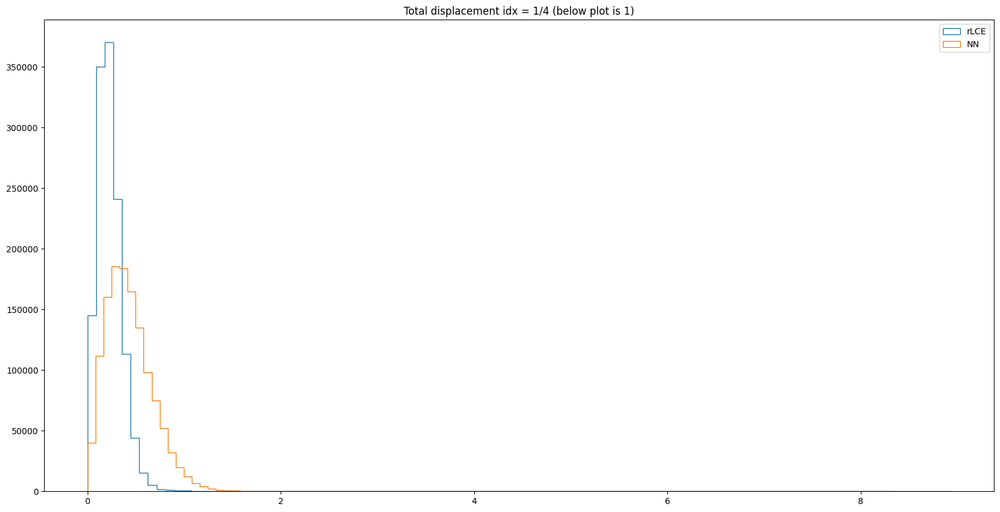

In [13]:
fig, ax = plt.subplots(1,1, figsize=(20,10))
ax=[ax]
ax[0].hist(np.linalg.norm(position - rLCE_new_pos, axis=-1), bins = 100, histtype='step', label='rLCE')
ax[0].set_title("Total displacement idx = 1/4 (below plot is 1)")
ax[0].hist(np.linalg.norm(position - NN_new_pos, axis=-1), bins = 100, histtype='step',label='NN')
plt.legend()
plt.show() # THIS WILL BE MAX DISPLACEMENT INDEX 1/4 ie 4 cm

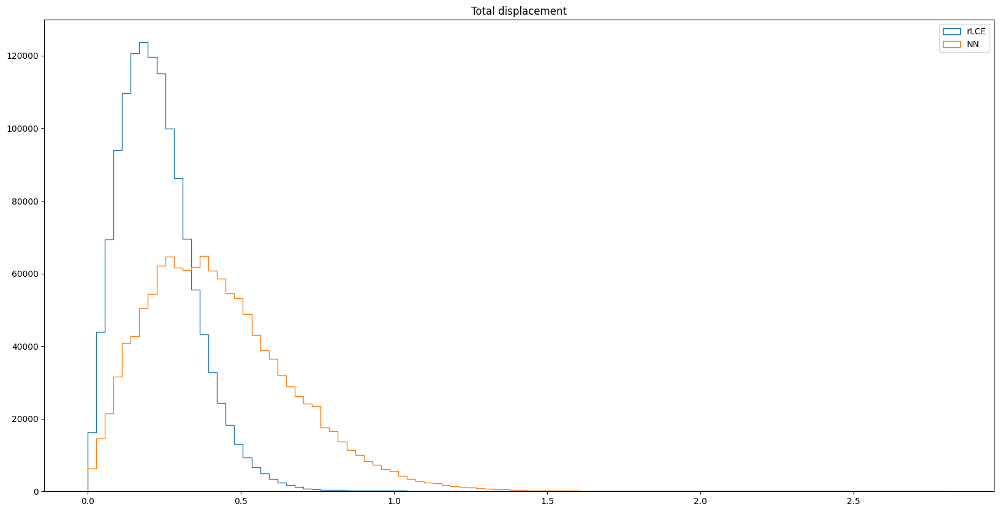

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(20,10))
ax=[ax]
ax[0].hist(np.linalg.norm(position - rLCE_new_pos, axis=-1), bins = 100, histtype='step', label='rLCE')
ax[0].set_title("Total displacement")
ax[0].hist(np.linalg.norm(position - NN_new_pos, axis=-1), bins = 100, histtype='step',label='NN')
plt.legend()
plt.show() # THIS WAS MAX DISPLACEMENT idx 1 ie 1 cm + \sum 1/N

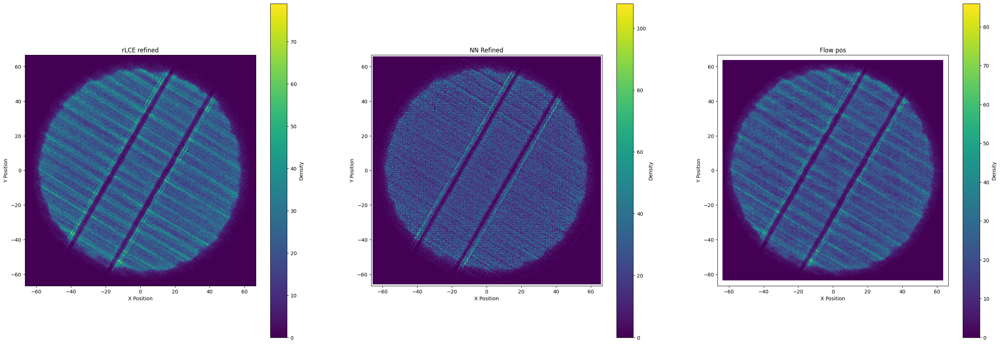

In [14]:
# Plot the refined data
bins = 300
fig, ax = plt.subplots(1,3, figsize=(35,12))
do_density_plot(ax[0], rLCE_new_pos, title="rLCE refined", bins = bins)
do_density_plot(ax[1], NN_new_pos, title="NN Refined", bins = bins)
ax[1].set_xlim(ax[0].get_xlim())
ax[1].set_ylim(ax[0].get_ylim())
do_density_plot(ax[2], position, title="Flow pos", bins = bins )
ax[2].set_xlim(ax[1].get_xlim())
ax[2].set_ylim(ax[1].get_ylim())
plt.show()

Text(0.5, 1.0, 'Difference')

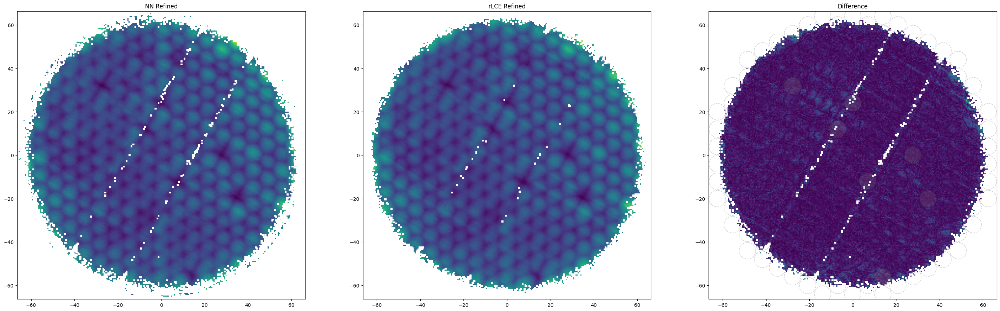

In [19]:
from scipy.stats import binned_statistic_2d
fig, ax = plt.subplots(1,3, figsize=(36,12))

x_bins = np.linspace(-tpc_radius, tpc_radius, bins)  # 20 bins for x
y_bins = np.linspace(-tpc_radius, tpc_radius, bins)  # 20 bins for y

stat, x_edges, y_edges, binnumber = binned_statistic_2d(
    NN_new_pos[:,0], NN_new_pos[:,1], (patterns/patterns.sum(axis=-1)[:,None]).max(axis=-1), statistic='median', bins=[x_bins, y_bins]
)
ax[0].imshow(
    stat.T, 
    origin='lower',
    extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
    aspect='equal',
    cmap='viridis'
)
ax[0].set_title("NN Refined")
stat_rLCE, x_edges, y_edges, binnumber = binned_statistic_2d(
    rLCE_new_pos[:,0], rLCE_new_pos[:,1], (patterns/patterns.sum(axis=-1)[:,None]).max(axis=-1), statistic='median', bins=[x_bins, y_bins]
)
ax[1].imshow(
    stat_rLCE.T, 
    origin='lower',
    extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
    aspect='equal',
    cmap='viridis'
)
ax[1].set_title("rLCE Refined")
ax[2].imshow(
    np.abs(stat_rLCE-stat).T, 
    origin='lower',
    extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
    aspect='equal',
    cmap='viridis'
)
plot_pmt_circles(ax[2], pmt_pos_top, dead_pmts, 0.2, linestyle='dashed')
ax[2].set_title("Difference")


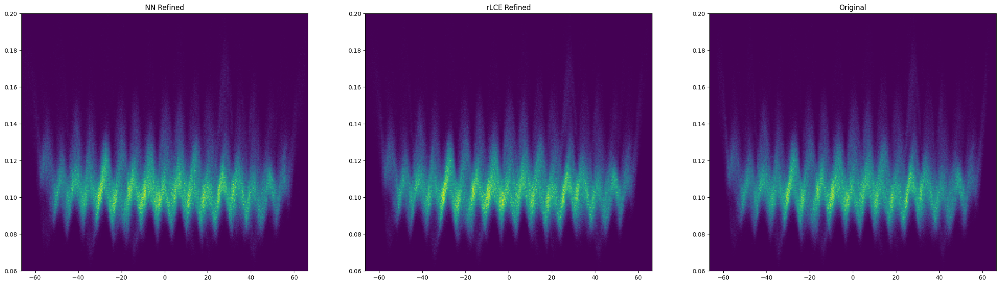

In [22]:
# Rotate NN_new_pos by 30 degrees
fig, ax= plt.subplots(1,3, figsize=(30,8))
ax=ax.flatten()
x_bins = np.linspace(-tpc_radius, tpc_radius, bins)  # 20 bins for x
y_bins = np.linspace(0.06, 0.2, bins)  # 20 bins for x
angle = 30
rot = np.array([[np.cos(np.radians(angle)), -np.sin(np.radians(angle))], [np.sin(np.radians(angle)), np.cos(np.radians(angle))]])
rotated = np.dot(NN_new_pos, rot)
ax[0].hist2d(rotated[:,1], (patterns/patterns.sum(axis=-1)[:,None]).max(axis=-1), bins=(x_bins,y_bins), cmap='viridis')
ax[0].set_title("NN Refined")
rotated = np.dot(rLCE_new_pos, rot)
ax[1].hist2d(rotated[:,1], (patterns/patterns.sum(axis=-1)[:,None]).max(axis=-1), bins=(x_bins,y_bins), cmap='viridis')
ax[1].set_title("rLCE Refined")
rotated = np.dot(position, rot)
ax[2].hist2d(rotated[:,1], (patterns/patterns.sum(axis=-1)[:,None]).max(axis=-1), bins=(x_bins,y_bins), cmap='viridis')
ax[2].set_title("Original")
plt.show()

In [27]:
# Need to free some memory
del binnumber, stat, stat_rLCE, x_bins, x_edges, y_bins, y_edges
import gc
gc.collect()

1/1 [==============================] - 0s 18ms/step


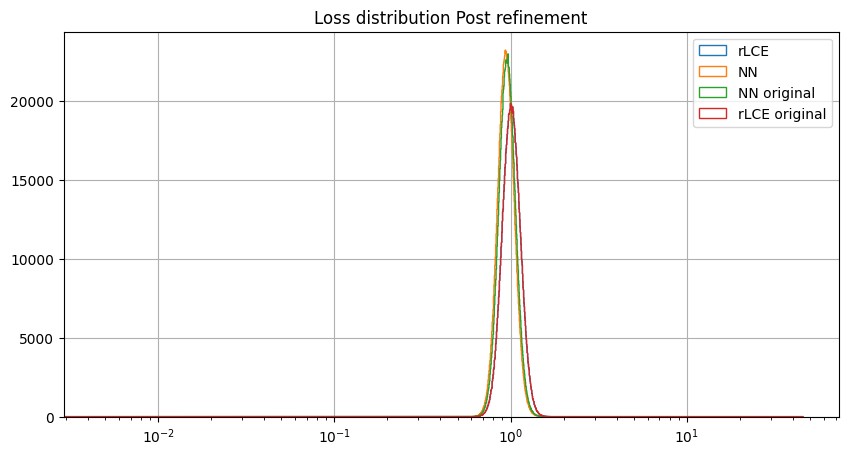

Median loss NN:  0.95262563
Median loss rLCE:  1.023316


In [39]:
# Plot the new loss distribution
bins = 10000
rlce_loss = radial_mc({'xx': rLCE_new_pos, 'yy':patterns})[1].numpy()
rlce_loss_orig = radial_mc({'xx': rLCE_new_pos, 'yy':patterns})[1].numpy()
# Generate in parts pregenerate NN_loss array and populate in 10 iterations
NN_loss = np.zeros_like(rlce_loss)
# Subdivide input arrays 
n_parts = 10
part_size = len(NN_new_pos) // n_parts
for i in range(n_parts):
    NN_loss[i*part_size:(i+1)*part_size] = model_chi2.predict({'xx':NN_new_pos[i*part_size:(i+1)*part_size], 'yy':patterns[i*part_size:(i+1)*part_size]})[1]
# And remainder portion
NN_loss[n_parts*part_size:] = model_chi2.predict({'xx':NN_new_pos[n_parts*part_size:], 'yy':patterns[n_parts*part_size:]})[1]


NN_loss_orig= np.zeros_like(rlce_loss)
# Subdivide input arrays 
n_parts = 10
part_size = len(NN_new_pos) // n_parts
for i in range(n_parts):
    NN_loss_orig[i*part_size:(i+1)*part_size] = model_chi2.predict({'xx':position[i*part_size:(i+1)*part_size], 'yy':patterns[i*part_size:(i+1)*part_size]})[1]
# And remainder portion
NN_loss_orig[n_parts*part_size:] = model_chi2.predict({'xx':NN_new_pos[n_parts*part_size:], 'yy':patterns[n_parts*part_size:]})[1]


# Make 2d log hist plot in x and y 
fig, ax = plt.subplots(1,1, figsize=(10,5))
# Adjust x bins for loss plot based on rlce_loss and NN loss
x_bins = np.linspace(0, max(rlce_loss.max(), NN_loss.max()), bins)
# And plot loss histograms
ax.hist(rlce_loss, bins = x_bins, histtype='step', label='rLCE')
ax.hist(NN_loss, bins = x_bins, histtype='step', label='NN')
ax.hist(NN_loss_orig, bins = x_bins, histtype='step', label='NN original')
ax.hist(rlce_loss_orig, bins = x_bins, histtype='step', label='rLCE original')
ax.set_xscale('log')
ax.grid()
ax.set_title("Loss distribution Post refinement")
ax.legend()
plt.show()

# Print medians of loss
print("Median loss NN: ", np.sort(NN_loss)[len(NN_loss)//2])
print("Median loss rLCE: ", np.sort(rlce_loss)[len(NN_loss)//2])

In [47]:
# Lets try with the anode shadow rLCE as well


h = 0.027 # cm 
opacity = 0.85
decay_constant = 10 # cm

def check_for_nan(tensor, message="NaN detected!"):
    """
    Checks if a tensor contains NaN values and prints a message if true.
    """
    if tf.reduce_any(tf.math.is_nan(tensor)):
        print(message)

class AdjustLCEAnodeShadow(keras.layers.Layer):
    """
    Computes Radius from input x, y
    """
    def __init__(self,pmt_pos_top,pmt_radius,decay_constant=1.,opacity=0.35, H=68.58 / 10, r=0.216 / 2 , h=0.027, angle=30., anode_mesh=True, n=10, **kwargs):
        super().__init__(**kwargs)

        self.decay_constant = tf.Variable(decay_constant, trainable=True, dtype=tf.float32, name="decay_constant", constraint=tf.keras.constraints.NonNeg())
        self.opacity = tf.Variable(opacity, trainable=True, dtype=tf.float32, name="opacity", constraint=tf.keras.constraints.NonNeg())
        #Always goes Nan -> And im not sure why
        # Something in backpropagation makes it go nan constantly 
        self.h =h#tf.Variable(h, trainable=True, dtype=tf.float32, name="h")


        self.pmt_area = np.pi * pmt_radius**2
        self.r = r
        self.H = H
        self.rotation_matrix = tf.constant([[np.cos(np.deg2rad(angle)), -np.sin(np.deg2rad(angle))], [np.sin(np.deg2rad(angle)), np.cos(np.deg2rad(angle))]],dtype='float32')
        if anode_mesh:
            self.anode_positions = self.get_anode_mesh_y()
        else:
            self.anode_positions = self.get_anode_perp_y()
            
        self.pmt_pos = tf.cast(self.roate_coordinate_system(pmt_pos_top[:,2].astype('float32'), pmt_pos_top[:,3].astype('float32')), dtype=tf.float32)

        # N anodes to compute for
        if n is not None:
            if n== 1:
                self.call_func = self.call_single
            else:
                self.n= n 
                self.call_func = self.call_all
        else: 
            self.call_func = self.call_all
            self.n=len(self.anode_positions)
        return
    
    def build(self, input_shape):
        super().build(input_shape)

    def roate_coordinate_system(self,x, y):
        """
        Returns system such that the parallel wires (supporting) are parallel to the y axis
        And the anode mesh is parallel to the x-axis
        """
        x_stack = tf.stack([x, y], axis=0)
        return tf.matmul(self.rotation_matrix, x_stack)
    
    def get_closest_anode(self,event_positions):
        """
        Get closest anode positions
        """
        diff = event_positions[:, np.newaxis] - self.anode_positions  # Shape (n, m)
        indices = tf.argmin(tf.abs(diff), axis=1)  # Shape (n,)
        return tf.gather(self.anode_positions, indices, axis=0)
    
    def get_n_closest_anodes(self, event_positions):
        """
        Get the n closest anode positions for each event position.
        Args:
            event_positions: A tensor of shape (num_events,).
            n: The number of closest anodes to retrieve.
        Returns:
            A tensor of shape (num_events, n) containing the positions of the n closest anodes.
        """
        # Compute the difference between event positions and anode positions
        diff = event_positions[:, tf.newaxis] - self.anode_positions  # Shape: (num_events, num_anodes)
        abs_diff = tf.abs(diff)  # Shape: (num_events, num_anodes)
        _, top_n_indices = tf.math.top_k(-abs_diff, k=self.n)  # Negative for smallest values; Shape: (num_events, n)
        closest_anodes = tf.gather(self.anode_positions, top_n_indices, axis=0, batch_dims=1)  # Shape: (num_events, n)
        
        return closest_anodes
    
    def get_anode_mesh_y(self,):
        """
        Anode Mesh wire positions rotated y (rel to above implemented rotation)
        """
        wire_pitch=5.0 / 10 # cm
        num_wires=265
        offset=0.25 # cm
        anode_mesh_pos = []
        for i in range(num_wires):
            # Calculate the x position for each wire
            x = (i - num_wires // 2) * wire_pitch
            x += offset
            anode_mesh_pos.append(x)

        return tf.constant(anode_mesh_pos,dtype='float32')
    
    def get_anode_perp_y(self,):
        """
        Anode Perpendicular wire positions rotated y
        """

        return tf.constant([31.8/2, -31.8/2, 28.3/2, -28.3/2],dtype='float32')

    def compute_PMT_Plane_projection(self, x, x0):
        """
        x -> The rotated x/y position for the wires in question should be 1d array (ie x or y)
        h -> The distance between anode wire center and S2 event plane
        x0 -> The anode wire position in question (scalar allthough vector might work as well)
        pmt_pos -> Vector of PMT Positions again only 1 of the coordinates in the rotated plane
        anode_constants -> Dataclass containing the relevant constants
        returns
        x1, x2 -> The 2 shadow boundary projections
        """
        theta = tf.math.atan(self.h/(x0-x))
        theta = tf.clip_by_value(theta, -tf.constant(np.pi/2), tf.constant(np.pi/2))
        alpha = tf.sqrt(h**2+(x-x0)**2+self.r**2) 
        phi = tf.math.asin(self.r/alpha)
        denom1 = 1/(tf.tan(theta-phi))
        denom1 = tf.where(tf.math.is_nan(denom1), tf.zeros_like(denom1), denom1)
        denom2 = 1/(tf.tan(theta+phi))
        denom2 = tf.where(tf.math.is_nan(denom2), tf.zeros_like(denom2), denom2)
        x1 = x + denom1 * x *(self.H + h)
        x2 = x + denom2 * x *(self.H + h)
        return x1, x2 # Same shape as x 
    
    def compute_coverage(self,x1, x2):
        """
        We compute shadowing and then coverage for each point -> xi is shape n_points
        
        Outputs n_points, m_pmts
        Values are scaled 0-> 1 
        """
        r2 = self.r**2
        def ar(x):
            """
            Computes right area coverage for x1 and x2

            Outputs n_points, m_pmts
            """
            # Extra angel subtended
            alpha = tf.math.atan((x[:, np.newaxis] - self.pmt_pos[1,:])/self.r)
            # If pmt is to the right of x is null
            ret_val = tf.zeros_like(alpha)
            #If  pmt is to the left of x-r is area of pmt
            left_condition = x[:, np.newaxis] < (self.pmt_pos[1,:] - self.r)
            ret_val = tf.where(left_condition, tf.constant(np.pi * r2, dtype=tf.float32), ret_val)

            # If inside the area, compute the sector area with the formula (pi/2 + 2 * alpha) * r^2
            inside_condition = (x[:, np.newaxis] > (self.pmt_pos[1,:] - self.r)) & (x[:, np.newaxis] < (self.pmt_pos[1,:] + self.r))

            # Use tf.where for the condition inside the circle and compute the area
            ret_val = tf.where(
                inside_condition,
                (np.pi / 2 + 2 * alpha) * r2,  # Formula for sector area
                ret_val
            )
            return ret_val
        return (ar(x1) - ar(x2))/self.pmt_area # Returns for each x, m pmts scaling parameters

    def compute_event_pmt_distance(self,x):
        """
        Compute 3d euclidean distanace
        Rotated or not frame doesnt matter
        """
        # shape n,2 , assume constant z -> Out n, m
        x_expanded = tf.expand_dims(tf.transpose(x, perm=[1,0]), axis=-1)  # Shape: (n_points,2, 1)
        pmt_pos_expanded = tf.expand_dims(self.pmt_pos, axis=0)  # Shape: (1, 2, m_pmts)
        squared_diff = tf.square(x_expanded - pmt_pos_expanded)  # Shape: (n_points, 2, m_pmts)
        squared_distances = tf.reduce_sum(squared_diff, axis=1)  # Shape: (n_points, m_pmts)
        z_diff_squared = (self.h + self.H)**2
        res = tf.sqrt(squared_distances + z_diff_squared)
        return res
    
    def modify_LCE(self,LCE, coverage, distance):
        """Computes the modified LCE
        
        LCE -> n,m
        coverage -> n,m
        distance -> n,m
        opacity -> 1
        decay_const -> 1
        
        """
        return LCE * (1- coverage * self.opacity * tf.exp(- distance / self.decay_constant))
    
    def LCE_modififier(self, coverage, distance):
        """Computes the LCE Multipler -> For vectorized 
        
        LCE -> n,m
        coverage -> n,m
        distance -> n,m
        opacity -> 1
        decay_const -> 1

        Exponential term
        Ok so we add 6.8 (dist to pmt) as this is the mimimum possible distance, at this when d=0.6 the response is essentially null, 
        so we force d non negative and add 0.8 such that the model can reasonably reach 0.6 ie remainder in decay_const is 0.2

        Coverage:
        For some reason the min is negative lets just force positive 
        Maximum value is O(1e-4) 
        
        For opacity to have any reasonable effect during training we assign a large multiplier 
        
        
        """
        return (1- tf.abs(coverage) * self.opacity *1e4* tf.exp(- (distance / (self.decay_constant+0.8))))#tf.maximum(
 
    @tensorflow.function
    def call_single(self, X, patterns):
        #tf.print(self.decay_constant, self.opacity, self.h)
        # Y coordinate of rated coord system (ie in line wiht mesh)
        #if tf.reduce_any(tf.math.is_nan(X)): print('Nan in input X')
        #if tf.reduce_any(tf.math.is_nan(patterns)): print('Nan in input patterns')
        x = self.roate_coordinate_system(X[:,0], X[:,1])
        #if tf.reduce_any(tf.math.is_nan(x)): print('Nan in rot x')
        x0 = self.get_closest_anode(x[1,:])
        #if tf.reduce_any(tf.math.is_nan(x0)): print('Nan in x0')
        # Shadow Projection on PMT plane
        x1, x2 =self.compute_PMT_Plane_projection(x[1,:], x0)
        #if tf.reduce_any(tf.math.is_nan(x1)): print('Nan in x1')
        #if tf.reduce_any(tf.math.is_nan(x2)): print('Nan in x2')
        # Very susceptible to nan for ill conditioned weights -and 0 gives minimal contribution which should be good
        coverage = self.compute_coverage(x1, x2)
        #if tf.reduce_any(tf.math.is_nan(coverage)): print('Nan in coverage')
        #coverage = tf.where(tf.math.is_nan(coverage), tf.zeros_like(coverage), coverage)
        distance = self.compute_event_pmt_distance(x)
        #if tf.reduce_any(tf.math.is_nan(distance)): print('Nan in distance')
        res = self.modify_LCE(patterns, coverage, distance)
        #if tf.reduce_any(tf.math.is_nan(res)): print('Nan in res')
        #res = tf.where(tf.math.is_nan(res), patterns, res)
        return res
    @tensorflow.function
    def call_all(self, X, patterns):
        """
        Compute for all anode wires
        
        """
        x = self.roate_coordinate_system(X[:,0], X[:,1])
        anodes = self.get_n_closest_anodes(x[1,:])
        # Can be broadcastet by reshaping x 
        x1, x2 =self.compute_PMT_Plane_projection(tf.expand_dims(x[1,:], axis=1), anodes)
        coverage = self.compute_coverage(tf.expand_dims(x1, axis=-1), tf.expand_dims(x2, axis=-1))
        distance = self.compute_event_pmt_distance(x)
        LCE_mods = self.LCE_modififier(coverage, tf.reshape(distance, (-1,1,1,self.pmt_pos.shape[1])))
        #tf.print(tf.reduce_mean(LCE_mods))
        #Multiply out :  (None, 1, 265, 246) squeeze out 1 multiply along 265
        return patterns*tf.reduce_prod(tf.squeeze(LCE_mods,axis=1), axis=1)
    
    def call(self, X,patterns):
        return self.call_func(X,patterns)


    def compute_output_shape(self, input_shape):
        return input_shape[0]
    

class CheckNaNLayer(tf.keras.layers.Layer):
    def __init__(self, message="NaN detected!"):
        super(CheckNaNLayer, self).__init__()
        self.message = message

    def call(self, inputs):
        # Perform the NaN check
        if tf.reduce_any(tf.math.is_nan(inputs)):
            print(self.message)

        return inputs



input_x = tf.keras.layers.Input(shape=(2,), name='xx', dtype=tf.float32)
x = tf.keras.layers.RepeatVector(n_alive_pmts, name='repeat_vector')(input_x)
rho = GetRadius((n_alive_pmts, 1), keras.backend.variable(pmt_positions[not_dead_pmts]), name='Event_Distance')(x)
#WallDist = GetWallDist((n_alive_pmts, 1),tpc_radius,name="WallDist")(x)
x = RadialLCELayer(guess=rLCE_params, n_groups=1, group_slices=np.arange(n_alive_pmts).reshape(1,-1),name='radial_LCE')(rho)
x = I0Layer(n_alive_pmts, name='i0')(x)
x = AdjustLCEAnodeShadow(pmt_pos_top[not_dead_pmts],pmt_radius,name='anode_shadow',
                         decay_constant =1, opacity=1)(input_x, x)

x = NormalizationLayer(name='normalization')(x)
# We pass the full array
input_y = tf.keras.layers.Input(shape=(n_pmts,), name='yy', dtype=tf.float32)
y_mod = FilterAlive(not_dead_pmts, name='aliveFilter')(input_y)
y, chi2 = Likelihood(n_alive_pmts, name='Likelihood')([x, y_mod])
radial_mc_with_anode = tf.keras.models.Model(inputs=[input_x, input_y],
                                    outputs=[y, chi2], name='Radial_mc')

"""
Not all learning rates are reasonable (below as tested by just training the one layer, values do not improve at this level only stable around a slightly worse point)

i0 : 1e-4
radial_LCE : 1e-5
anode_shadow : 

"""


radial_mc_with_anode.get_layer('i0').set_weights([i0s]) 
radial_mc_with_anode.get_layer('i0').trainable              = False
radial_mc_with_anode.get_layer('anode_shadow').trainable    = True
radial_mc_with_anode.get_layer('radial_LCE').trainable      = False
# not to be trained
radial_mc_with_anode.get_layer('Event_Distance').trainable = False
radial_mc_with_anode.get_layer('Likelihood').trainable = False
radial_mc_with_anode.get_layer('Likelihood').set_weights(loss_weights)

def _logl_loss(patterns, likelihood):
    masked_tensor = tf.boolean_mask(likelihood, tf.math.is_finite(likelihood))
    return tf.reduce_mean(masked_tensor)

def _logl_loss(patterns, likelihood):
    return likelihood[1]*10

radial_mc_with_anode.compile(
    loss=_logl_loss,
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-2),
    )
radial_mc_with_anode.summary()

Model: "Radial_mc"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 xx (InputLayer)             [(None, 2)]                  0         []                            
                                                                                                  
 repeat_vector (RepeatVecto  (None, 246, 2)               0         ['xx[0][0]']                  
 r)                                                                                               
                                                                                                  
 Event_Distance (GetRadius)  (None, 246)                  492       ['repeat_vector[0][0]']       
                                                                                                  
 radial_LCE (RadialLCELayer  (None, 246)                  4         ['Event_Distance[0][0]

In [48]:
rLCE_anode_new_pos = gen_better_pos_mem_efficient(radial_mc_with_anode, position, patterns, min_diff=1/128 *2, idx=1/2)

40317/40317 [==============================] - 86s 2ms/step


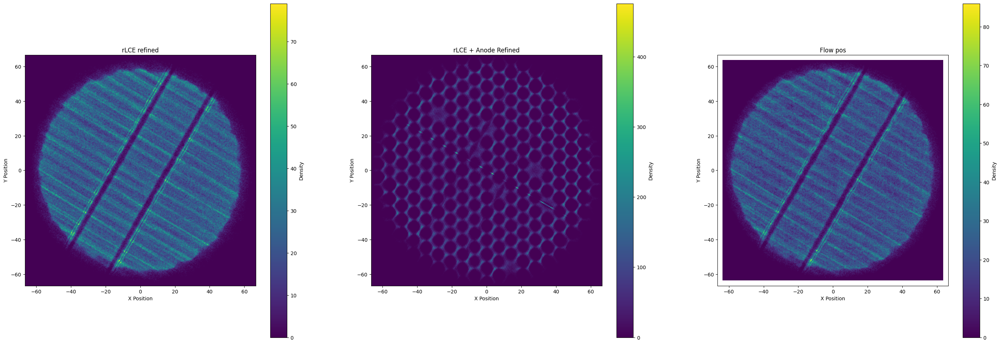

In [ ]:
# Plot the refined data
bins = 300
fig, ax = plt.subplots(1,3, figsize=(35,12))
do_density_plot(ax[0], rLCE_new_pos, title="rLCE refined", bins = bins)
do_density_plot(ax[1], rLCE_anode_new_pos, title="rLCE + Anode Refined", bins = bins)
ax[1].set_xlim(ax[0].get_xlim())
ax[1].set_ylim(ax[0].get_ylim())
do_density_plot(ax[2], position, title="Flow pos", bins = bins )
ax[2].set_xlim(ax[1].get_xlim())
ax[2].set_ylim(ax[1].get_ylim())
plt.show()

## Check chi^2 sensitive enough : TODO Check S2 Area dependendance of maximum PMT only

Check Variation of Chi squared across full grid 

In [13]:
# Random Points for which to evaluate
n_pts = 10

subgrid = np.random.choice(np.arange(xy_grid.shape[0]),size=(n_pts))

# we just reuse this grid cause why not 
eval_grid = xy_grid

rLCEpat_rLCEeval = np.zeros((n_pts, eval_grid.shape[0]))
NNpat_rLCEeval = np.zeros((n_pts, eval_grid.shape[0]))
NNpat_NNeval = np.zeros((n_pts, eval_grid.shape[0]))
rLCEpat_NNeval = np.zeros((n_pts, eval_grid.shape[0]))

for i, idx in enumerate(subgrid):
    # Predict over full grid 
    rLCEpat_rLCEeval[i,:] = radial_mc.predict({'xx':eval_grid, 'yy':np.repeat(rlce_grid_rand[idx:idx+1], xy_grid.shape[0], axis=0)})[1]
    NNpat_rLCEeval[i,:] = radial_mc.predict({'xx':eval_grid, 'yy':np.repeat(nn_grid_rand[idx:idx+1], xy_grid.shape[0], axis=0)})[1]
    NNpat_NNeval[i,:] = model_chi2.predict({'xx':eval_grid, 'yy':np.repeat(nn_grid_rand[idx:idx+1], xy_grid.shape[0], axis=0)})[1]
    rLCEpat_NNeval[i,:] = model_chi2.predict({'xx':eval_grid, 'yy':np.repeat(rlce_grid_rand[idx:idx+1], xy_grid.shape[0], axis=0)})[1]

6895/6895 [==============================] - 20s 3ms/step


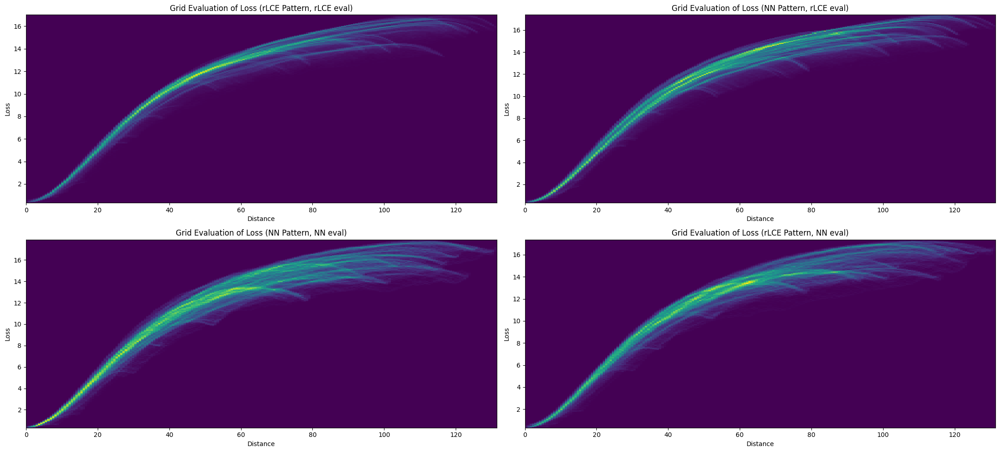

In [14]:
distances = np.linalg.norm(xy_grid[:, None, :] - xy_grid[subgrid][None, :, :], axis=-1)

# Define the results to plot
results = [
    ("rLCE Pattern, rLCE eval", rLCEpat_rLCEeval),
    ("NN Pattern, rLCE eval", NNpat_rLCEeval),
    ("NN Pattern, NN eval", NNpat_NNeval),
    ("rLCE Pattern, NN eval", rLCEpat_NNeval),
]

# Create a 2x2 plot grid
fig, axes = plt.subplots(2, 2, figsize=(22, 10))

# Plot each histogram
for ax, (title, res) in zip(axes.flatten(), results):
    ax.hist2d(distances.T.flatten(), res.flatten(), bins=200, cmap='viridis')
    ax.set_xlabel("Distance")
    ax.set_ylabel("Loss")
    ax.set_title(f"Grid Evaluation of Loss ({title})")

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


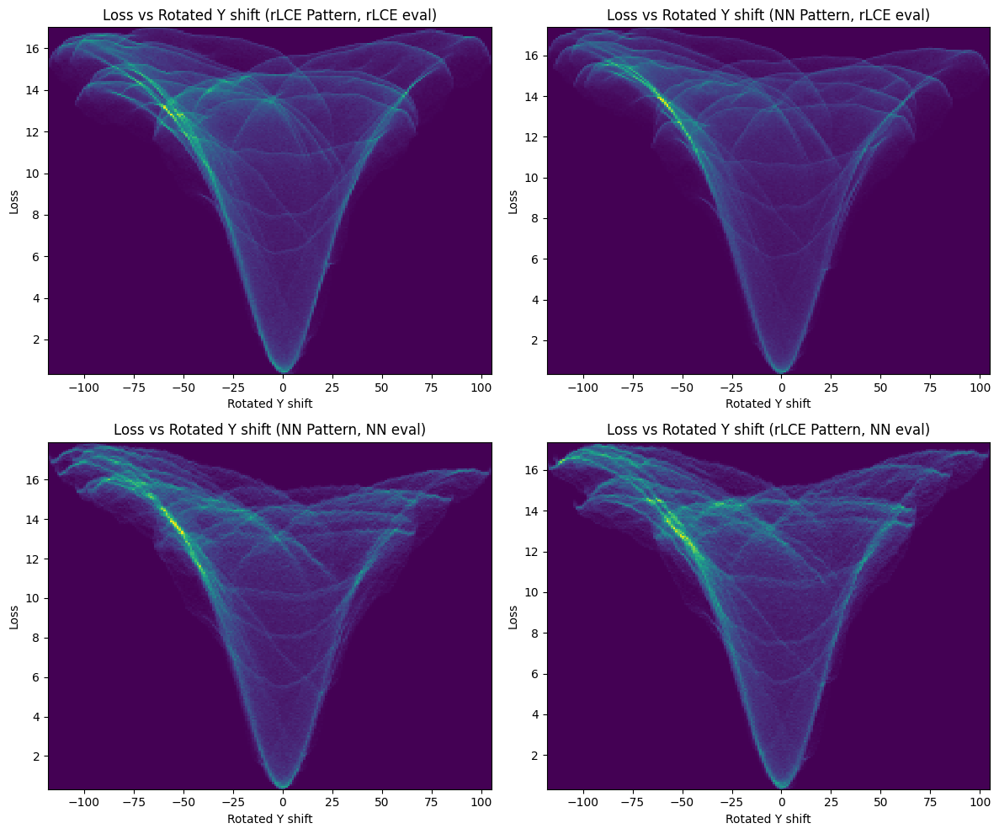

In [15]:
# Rotate the grid by 30 degrees
theta = np.radians(30)
rotation_matrix = np.array([[np.cos(theta), -np.sin(theta)],
                            [np.sin(theta),  np.cos(theta)]])
rotated_grid = xy_grid @ rotation_matrix.T

# Extract the rotated y-coordinate
rotated_y = rotated_grid[:, 1]  # Shape: (220618,)

# Define the results to plot
results = [
    ("rLCE Pattern, rLCE eval", rLCEpat_rLCEeval),
    ("NN Pattern, rLCE eval", NNpat_rLCEeval),
    ("NN Pattern, NN eval", NNpat_NNeval),
    ("rLCE Pattern, NN eval", rLCEpat_NNeval),
]

# Create a 2x2 plot grid
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Plot each histogram
for ax, (title, res) in zip(axes.flatten(), results):
    ax.hist2d((rotated_y[np.newaxis,:].repeat(res.shape[0],axis=0)-rotated_y[subgrid,np.newaxis]).flatten(), res.flatten(), bins=200, cmap='viridis')
    ax.set_xlabel("Rotated Y shift")
    ax.set_ylabel("Loss")
    ax.set_title(f"Loss vs Rotated Y shift ({title})")

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

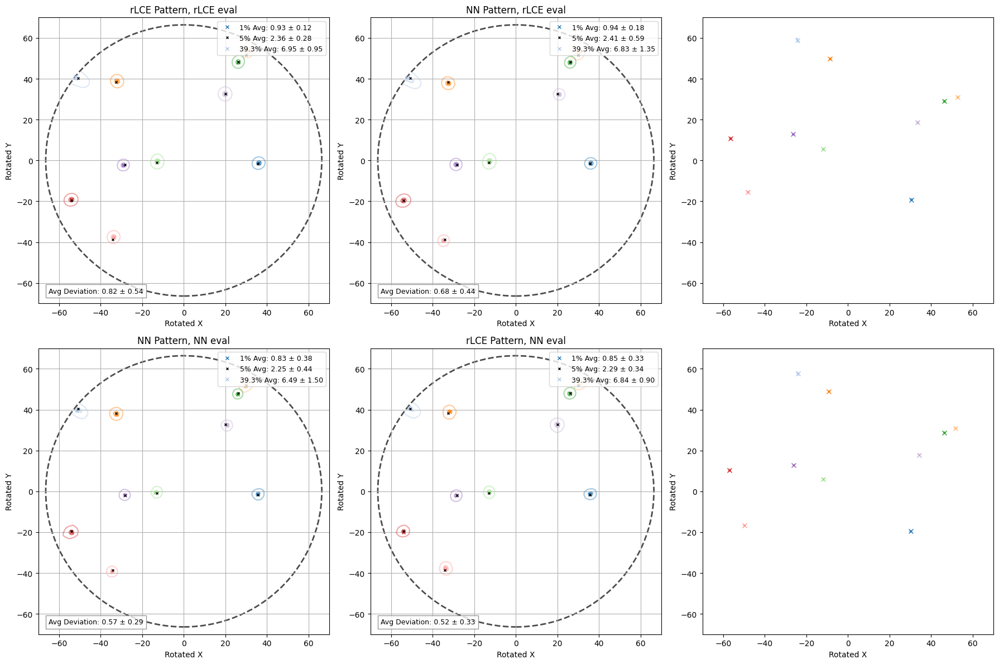

In [52]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
from scipy.interpolate import griddata
from matplotlib.cm import get_cmap
from matplotlib.patches import Circle

# Rotate the grid by 30 degrees
theta = np.radians(30)
rotation_matrix = np.array([[np.cos(theta), -np.sin(theta)],
                            [np.sin(theta),  np.cos(theta)]])
rotated_grid = xy_grid @ rotation_matrix.T

# Extract the rotated x and y coordinates
rotated_x = rotated_grid[:, 0]
rotated_y = rotated_grid[:, 1]

# Define the datasets to plot
datasets = [
    ("rLCE Pattern, rLCE eval", rLCEpat_rLCEeval),
    ("NN Pattern, rLCE eval", NNpat_rLCEeval),
    ("NN Pattern, NN eval", NNpat_NNeval),
    ("rLCE Pattern, NN eval", rLCEpat_NNeval),
]

# Set up colormap
cmap = get_cmap("tab20")
colors = [cmap(i) for i in range(10)]  # 10 events


# Create the 2x3 plot grid
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Iterate over the datasets for the first two columns
for ax, (dataset_name, data) in zip(axes[:, :2].flatten(), datasets):
    contour_diameters = {"1%": [], "5%": [], "39.3%": []}  # To track diameters
    deviations = []  # To track deviations between actual and minimum loss coordinates
    for event_idx, event_id in enumerate(subgrid):  # Subset using subgrid
        loss = data[event_idx]
        
        # Compute the minimum loss value and thresholds
        min_loss = np.min(loss)
        thresholds = {
            "1%": (min_loss * 1.01, 0.8),
            "5%": (min_loss * 1.05, 0.6),
            "39.3%": (min_loss * 1.393, 0.4),
        }
        
        # Interpolate loss values onto a grid for smooth contouring
        grid_x, grid_y = np.meshgrid(
            np.linspace(rotated_x.min(), rotated_x.max(), 500),
            np.linspace(rotated_y.min(), rotated_y.max(), 500),
        )
        grid_loss = griddata(
            points=(rotated_x, rotated_y),
            values=loss,
            xi=(grid_x, grid_y),
            method="linear",
        )
        
        # Plot contours and calculate diameters
        for label, (threshold, alpha) in thresholds.items():
            color = colors[event_idx]  # Use a unique color for the subset
            ax.contour(
                grid_x, grid_y, grid_loss, levels=[threshold], colors=[color], linewidths=1.5, alpha=alpha
            )

            # Identify points within the contour and calculate the diameter
            mask = loss <= threshold
            x_within = rotated_x[mask]
            y_within = rotated_y[mask]
            if len(x_within) > 1:
                distances = cdist(
                    np.column_stack((x_within, y_within)),
                    np.column_stack((x_within, y_within)),
                )
                diameter = np.max(distances)
            else:
                diameter = 0
            contour_diameters[label].append(diameter)
        
        # Plot the minimum loss location
        min_idx = np.argmin(loss)
        ax.plot(rotated_x[min_idx], rotated_y[min_idx], 'x', color=colors[event_idx], markersize=4)

        # Rotate the original event site and calculate deviation
        rotated_point = rotation_matrix @ np.array([xy_grid[event_id, 0], xy_grid[event_id, 1]])
        ax.plot(rotated_point[0], rotated_point[1], 'x', color='black', markersize=2.5)

        # Deviation calculation
        deviation = np.linalg.norm(rotated_point - np.array([rotated_x[min_idx], rotated_y[min_idx]]))
        deviations.append(deviation)

    # Calculate average diameters and standard deviations
    legend_entries = []
    for label, diameters in contour_diameters.items():
        avg_diameter = np.mean(diameters)
        std_diameter = np.std(diameters)
        legend_entries.append(f"{label} Avg: {avg_diameter:.2f} ± {std_diameter:.2f}")

    # Add a circle of radius 66.4
    circle = Circle((0, 0), 66.4, color="black", fill=False, linewidth=2, linestyle="--", alpha=0.7)
    ax.add_patch(circle)

    # Calculate average deviation and count exceeding minimum grid size
    avg_deviation = np.mean(deviations)
    std_deviation = np.std(deviations)
    min_grid_size = (rotated_x.max() - rotated_x.min()) / 500
    deviations_exceeding = np.sum(np.array(deviations) > min_grid_size)

    # Add a text box in the bottom left
    ax.text(-65, -65,  # Adjust position as needed
            f"Avg Deviation: {avg_deviation:.2f} ± {std_deviation:.2f}",
            fontsize=9, bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray'))

    # Customize each subplot
    ax.set_title(dataset_name)
    ax.set_xlabel("Rotated X")
    ax.set_ylabel("Rotated Y")
    ax.set_xlim(-70, 70)
    ax.set_ylim(-70, 70)
    ax.legend(legend_entries, loc="upper right", fontsize=9)
    ax.grid()

# Extra column for event site and contours
sub_ax = axes[:, 2]

for event_idx in range(len(subgrid)):
    event_id = subgrid[event_idx] # Use the subset of events
    # Plot the NN flow position
    nn_pos = flow_pos_nn[event_id]
    nn_contour = flow_contours_nn[event_id]
    sub_ax[1].plot(nn_contour[:,0], nn_contour[:,1], color=colors[event_idx], ms=0, lw=1, alpha=0.6, label="NN Contour")
    
    # Plot the rLCE flow position on top
    rlce_pos = flow_pos_rLCE[event_id]
    rlce_contour = flow_contours_rLCE[event_id]
    sub_ax[0].plot(rlce_contour[:,0], rlce_contour[:,1], color=colors[event_idx], ms=0, lw=1, alpha=0.8, label="rLCE Contour")
    
    # Highlight the event site
    sub_ax[1].plot(nn_pos[0], nn_pos[1], 'x', color=colors[event_idx], label="NN Event Site")
    sub_ax[0].plot(rlce_pos[0], rlce_pos[1], 'x', color=colors[event_idx], label="rLCE Event Site")
    
    # Customize plot
    for ax in sub_ax:
        ax.set_xlabel("Rotated X")
        ax.set_ylabel("Rotated Y")
        ax.set_xlim(-70, 70)
        ax.set_ylim(-70, 70)
        ax.grid()

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


## Make alternate real data plots (along direction of hexagons) - see if any behavior can be observed

In [109]:
event_site = (0,0)
gridpoints = 10
theta = np.radians(30)
rotation_matrix = np.array([[np.cos(theta), -np.sin(theta)],
                            [np.sin(theta),  np.cos(theta)]])
pmt_rot = pmt_pos_top[:,2:].astype('float') @ rotation_matrix.T
# And generate a line grid for which we generate datapoints
x_rot = np.linspace(-tpc_radius, tpc_radius, gridpoints)
y_rot = np.zeros_like(x_rot)
theta = np.radians(-30)
rotation_matrix = np.array([[np.cos(theta), -np.sin(theta)],
                            [np.sin(theta),  np.cos(theta)]])
xy_grid = np.column_stack([x_rot, y_rot]) @ rotation_matrix.T
# Get indices where y coordinate is close to zero
pmt_on_yrotnull = np.isclose(pmt_rot[:,1], 0, atol=0.1)

In [110]:
rlce_pat = radial_pattern.predict({'xx':xy_grid})
nn_pat = model_pattern.predict({'xx':xy_grid})

1/1 [==============================] - 0s 10ms/step


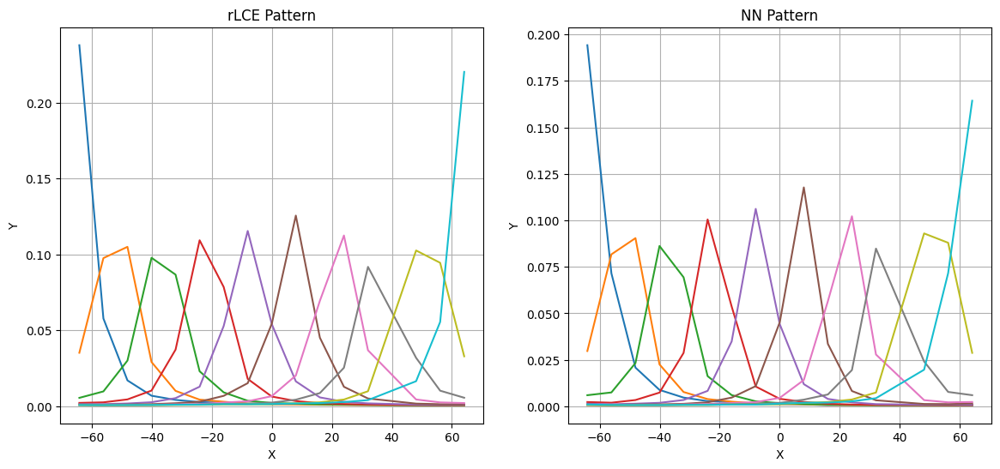

In [114]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))
for i in range(len(xy_grid)):
    ax[0].plot(pmt_rot[not_dead_pmts][pmt_on_yrotnull[not_dead_pmts],0], rlce_pat[i,pmt_on_yrotnull[not_dead_pmts]])
    ax[1].plot(pmt_rot[not_dead_pmts][pmt_on_yrotnull[not_dead_pmts],0], nn_pat[i,pmt_on_yrotnull[not_dead_pmts]])
ax[0].set_title("rLCE Pattern")
ax[0].set_xlabel("X")
ax[0].set_ylabel("Y")
ax[1].set_title("NN Pattern")
ax[1].set_xlabel("X")
ax[1].set_ylabel("Y")
ax[0].grid()
ax[1].grid()


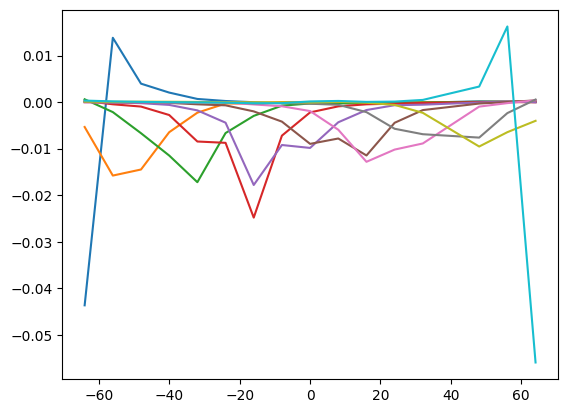

In [113]:
for i in range(len(xy_grid)):
    plt.plot(pmt_rot[not_dead_pmts][pmt_on_yrotnull[not_dead_pmts],0], (nn_pat[i,:]-rlce_pat[i,:])[pmt_on_yrotnull[not_dead_pmts]])

In [83]:
pmt_on_yrotnull[not_dead_pmts].shape

(246,)